In [23]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import io, transforms
from torch.utils.data import Dataset, DataLoader, random_split
from transformers import Seq2SeqTrainer, Seq2SeqTrainingArguments, VisionEncoderDecoderModel, ViTFeatureExtractor, AutoTokenizer, GPT2Config, default_data_collator
import os
import datasets
import numpy as np
import pandas as pd
from PIL import Image
from pathlib import Path
from tqdm.auto import tqdm
import multiprocessing as mp
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import pickle
from tqdm import tqdm
from nltk.translate.bleu_score import corpus_bleu
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction

In [2]:
import kagglehub
path = kagglehub.dataset_download("adityajn105/flickr8k")

In [3]:
captions = pd.read_csv('/kaggle/input/flickr8k/captions.txt').dropna()
captions.head()

,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...


# Image Visualize

In [4]:
def display_images(temp_df):
    temp_df = temp_df.reset_index(drop=True)
    plt.figure(figsize = (20 , 20))
    n = 0
    for i in range(15):
        n+=1
        plt.subplot(5 , 5, n)
        plt.subplots_adjust(hspace = 0.7, wspace = 0.3)
        image = readImage(f"../input/flickr8k/Images/{temp_df.image[i]}")
        plt.imshow(image)
        plt.title("\n".join(wrap(temp_df.caption[i], 20)))
        plt.axis("off")

In [5]:
def readImage(path, img_size = 224):
    return img_to_array(load_img(path, color_mode = 'rgb', target_size = (img_size, img_size))) / 255.

def visualizeImage(path, temp_df, text_col = 'caption', model_name = None):
    temp_df = temp_df.reset_index(drop = True)

    fig, axes = plt.subplots(2, 3, figsize = (20, 20))
    axes = axes.flatten()

    for i in range(temp_df.shape[0]):
        image = readImage(os.path.join(path, temp_df['image'].iloc[i]))
        caption = temp_df[text_col].iloc[i]

        axes[i].imshow(image)
        axes[i].axis('off')
        axes[i].set_title(caption)
        
    if model_name:
        plt.suptitle(model_name, fontsize=24)
    plt.tight_layout()
    plt.show()

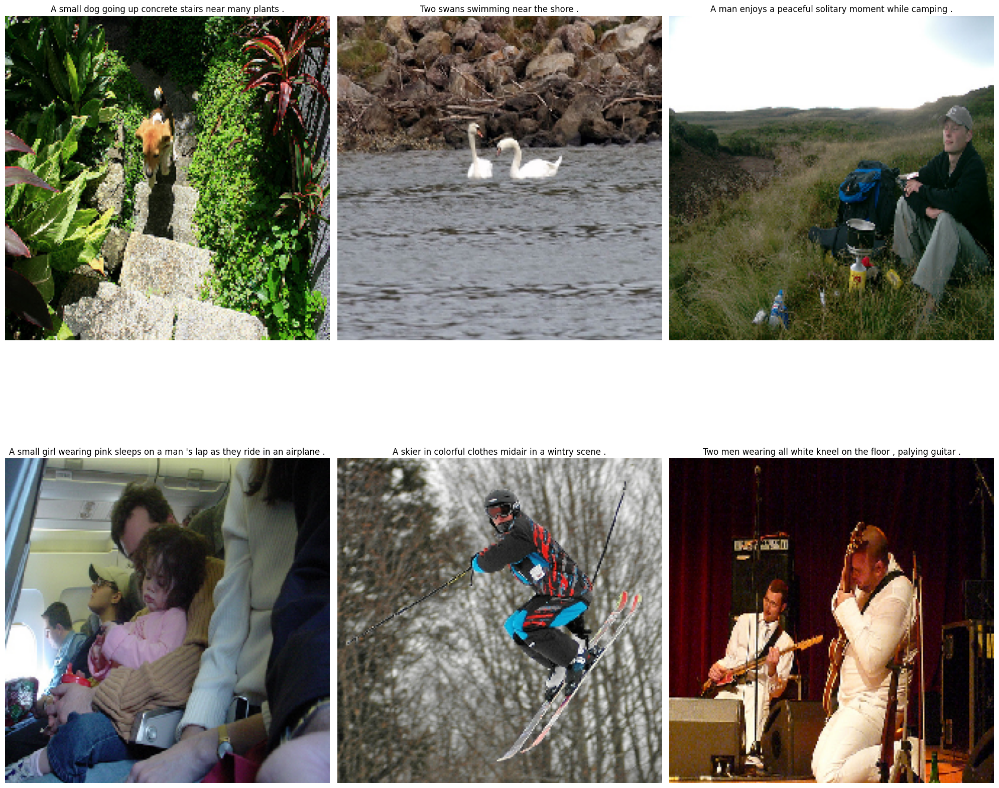

In [6]:
PATH = '/kaggle/input/flickr8k/Images'
visualizeImage(PATH, captions.sample(6), text_col = 'caption')

# Word Embedding

In [7]:
def tokenize(text):
    text = text.lower()
    text = text.replace("[^A-Za-z]","")
    text = text.replace("\s+"," ")
    text = " ".join([word for word in text.split() if len(word) > 1])
    text = f"sos {text} eos"
    return text

captions['captionn'] = captions['caption'].apply(tokenize)

In [8]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(captions['captionn'])
vocabulary = tokenizer.word_index
vocab_size = len(tokenizer.word_index) + 1
max_length = max(len(caption.split()) for caption in captions['captionn'])

images = captions['image'].unique().tolist()

train_images, test_images = train_test_split(images, test_size = 0.2, random_state = 42)

train_df = captions[captions['image'].isin(train_images)].reset_index(drop = True)
test_df = captions[captions['image'].isin(test_images)].reset_index(drop = True)

# Features Extraction

In [9]:
model = InceptionV3(weights = 'imagenet')
featureEx = Model(inputs = model.input, outputs = model.layers[-2].output)

IMG_SIZE = 299
features = {}

for image in tqdm(images):
    img = load_img(os.path.join('/kaggle/input/flickr8k/Images', image), target_size = (IMG_SIZE, IMG_SIZE))
    img = img_to_array(img) / 255.
    img = np.expand_dims(img, axis = 0)

    feature = featureEx.predict(img, verbose = 0)
    features[image] = feature

I0000 00:00:1751563643.775515      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1751563643.776234      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


96112376/96112376 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


  0%|          | 0/8091 [00:00<?, ?it/s]WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
I0000 00:00:1751563651.180452     103 service.cc:148] XLA service 0x7d2f80055d10 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1751563651.181883     103 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1751563651.181907     103 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1751563652.171664     103 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1751563657.267278     103 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
100%|██████████| 8091/8091 [13:45<00:00,  9.80it/s]


# Custom Data Generator

In [10]:
class CustomDataGenerator(Sequence):
    
    def __init__(self, df, X_col, y_col, batch_size, directory, tokenizer, 
                 vocab_size, max_length, features,shuffle=True):
    
        self.df = df.copy()
        self.X_col = X_col
        self.y_col = y_col
        self.directory = directory
        self.batch_size = batch_size
        self.tokenizer = tokenizer
        self.vocab_size = vocab_size
        self.max_length = max_length
        self.features = features
        self.shuffle = shuffle
        self.n = len(self.df)
        
    def on_epoch_end(self):
        if self.shuffle:
            self.df = self.df.sample(frac=1).reset_index(drop=True)
    
    def __len__(self):
        return self.n // self.batch_size
    
    def __getitem__(self,index):
    
        batch = self.df.iloc[index * self.batch_size:(index + 1) * self.batch_size,:]
        X1, X2, y = self.__get_data(batch)        
        return (X1, X2), y
    
    def __get_data(self,batch):
        
        X1, X2, y = list(), list(), list()
        
        images = batch[self.X_col].tolist()
           
        for image in images:
            feature = self.features[image][0]
            
            captions = batch.loc[batch[self.X_col]==image, self.y_col].tolist()
            for caption in captions:
                seq = self.tokenizer.texts_to_sequences([caption])[0]

                for i in range(1,len(seq)):
                    in_seq, out_seq = seq[:i], seq[i]
                    in_seq = pad_sequences([in_seq], maxlen=self.max_length)[0]
                    out_seq = to_categorical([out_seq], num_classes=self.vocab_size)[0]
                    X1.append(feature)
                    X2.append(in_seq)
                    y.append(out_seq)
            
        X1, X2, y = np.array(X1), np.array(X2), np.array(y)
                
        return X1, X2, y

In [11]:
train_generator = CustomDataGenerator(df = train_df, X_col = 'image', y_col = 'captionn', batch_size = 64, directory = '/kaggle/input/flickr8k/Images',
                                     tokenizer = tokenizer, vocab_size = vocab_size, max_length = max_length, features = features)

test_generator = CustomDataGenerator(df = test_df, X_col = 'image', y_col = 'captionn', batch_size = 64, directory = '/kaggle/input/flickr8k/Images',
                                     tokenizer = tokenizer, vocab_size = vocab_size, max_length = max_length, features = features)


# Image Captioning | LSTM Model

In [ ]:
input1 = layers.Input(shape = (2048, ))
input2 = layers.Input(shape = (max_length, ))

img_features = layers.Dense(256, activation = 'relu')(input1)
img_features_reshaped = layers.Reshape((1, 256), input_shape = (256, ))(img_features)

sentence_features = layers.Embedding(vocab_size, 256, mask_zero = False)(input2)

merged = layers.concatenate([img_features_reshaped, sentence_features], axis = 1)

sentence_features = layers.LSTM(256)(merged)

x = layers.Dropout(0.2)(sentence_features)
x = layers.add([x, img_features])
x = layers.Dense(256, activation = 'relu')(x)
x = layers.Dropout(0.2)(x)
outputs = layers.Dense(vocab_size, activation = 'softmax')(x)

model_lstm_captioning = Model(inputs = [input1, input2], outputs = outputs)

optimizer = optimizers.Adam(learning_rate = 1e-3, clipvalue = 1.0)
model_lstm_captioning.compile(
    optimizer = optimizer,
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

earlyStopping = EarlyStopping(monitor = 'val_loss', patience = 10, restore_best_weights = True)
reduceLRONPlateau = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.5, patience = 2, min_lr = 1e-6, verbose = 1)
callbacks = [earlyStopping, reduceLRONPlateau]

history_lstm_captioning = model_lstm_captioning.fit(train_generator, epochs = 50, validation_data = test_generator, callbacks = callbacks)

model_lstm_captioning.save('/kaggle/working/model_lstm_captioning.keras')
with open('/kaggle/working/model_lstm_captioning.pkl', 'wb') as f:
    pickle.dump(history_lstm_captioning.history, f)

# Image Captioning | LSTM + Attention

In [ ]:
input1 = layers.Input(shape = (2048, ))
input2 = layers.Input(shape = (max_length,))

img_features = layers.Dense(256, activation = 'relu')(input1)
img_features = layers.Reshape((1, 256))(img_features)

sentence_features = layers.Embedding(input_dim = vocab_size, output_dim = 256, mask_zero = False)(input2)

merged = layers.Concatenate(axis = 1)([img_features, sentence_features])

lstm_output = layers.LSTM(256, return_sequences = True)(merged)

query = img_features
attention_output = layers.Attention()([query, lstm_output])

attention_output = layers.Reshape((256, ))(attention_output)

x = layers.Add()([attention_output, layers.Reshape((256, ))(img_features)])

x = layers.Dense(256, activation = 'relu')(x)
x = layers.Dropout(0.2)(x)

outputs = layers.Dense(vocab_size, activation = 'softmax')(x)

model_lstm_attention_captioning = Model(inputs = [input1, input2], outputs = outputs)

optimizer = optimizers.Adam(learning_rate = 1e-3, clipvalue = 1.0)
model_lstm_attention_captioning.compile(
    optimizer = optimizer,
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

history_lstm_attention_captioning = model_lstm_attention_captioning.fit(train_generator, epochs = 50, validation_data = test_generator, callbacks = callbacks)

model_lstm_attention_captioning.save('/kaggle/working/model_lstm_attention_captioning.keras')
with open('/kaggle/working/model_lstm_attention_captioning.pkl', 'wb') as f:
    pickle.dump(history_lstm_attention_captioning.history, f)

# Image Captioning | ViT-GPT2
# ----------------------------------------------------------------------------------------------------------

In [ ]:
os.environ["WANDB_DISABLED"] = "true"
class config:
    ENCODER = "google/vit-base-patch16-224"
    DECODER = "gpt2"
    TRAIN_BATCH_SIZE = 8
    VAL_BATCH_SIZE = 8
    VAL_EPOCHS = 1
    LR = 5e-5
    SEED = 42
    MAX_LEN = 128
    SUMMARY_LEN = 20
    WEIGHT_DECAY = 0.01
    MEAN = (0.485, 0.456, 0.406)
    STD = (0.229, 0.224, 0.225)
    TRAIN_PCT = 0.95
    NUM_WORKERS = mp.cpu_count()
    EPOCHS = 10
    IMG_SIZE = (224,224)
    LABEL_MASK = -100
    TOP_K = 1000
    TOP_P = 0.95

In [ ]:
def build_inputs_with_special_tokens(self, token_ids_0, token_ids_1=None):
    outputs = [self.bos_token_id] + token_ids_0 + [self.eos_token_id]
    return outputs
AutoTokenizer.build_inputs_with_special_tokens = build_inputs_with_special_tokens

In [ ]:
feature_extractor = ViTFeatureExtractor.from_pretrained(config.ENCODER)
tokenizer = AutoTokenizer.from_pretrained(config.DECODER)
tokenizer.pad_token = tokenizer.unk_token

In [ ]:
transforms = transforms.Compose([
    transforms.Resize(config.IMG_SIZE),
    transforms.ToTensor(),
    # transforms.Normalize(mean = 0.5, std = 0.5)
])

captions = pd.read_csv("/kaggle/input/flickr8k/captions.txt")
train_captions, val_captions = train_test_split(captions, test_size = 0.2)
captions.head()

In [ ]:
class ImgDataset(Dataset):
    def __init__(self, df,root_dir,tokenizer,feature_extractor, transform = None):
        self.df = df
        self.transform = transform
        self.root_dir = root_dir
        self.tokenizer= tokenizer
        self.feature_extractor = feature_extractor
        self.max_length = 50
    def __len__(self,):
        return len(self.df)
    def __getitem__(self,idx):
        caption = self.df.caption.iloc[idx]
        image = self.df.image.iloc[idx]
        img_path = os.path.join(self.root_dir , image)
        img = Image.open(img_path).convert("RGB")
        
        if self.transform is not None:
            img= self.transform(img)
        pixel_values = self.feature_extractor(img, return_tensors="pt").pixel_values
        captions = self.tokenizer(caption,
                                 padding='max_length',
                                 max_length=self.max_length).input_ids
        captions = [caption if caption != self.tokenizer.pad_token_id else -100 for caption in captions]
        encoding = {"pixel_values": pixel_values.squeeze(), "labels": torch.tensor(captions)}
        return encoding

train_dataset = ImgDataset(train_captions, root_dir = "/kaggle/input/flickr8k/Images", tokenizer = tokenizer,
                          feature_extractor = feature_extractor, transform = transforms)

val_dataset = ImgDataset(val_captions, root_dir = "/kaggle/input/flickr8k/Images", tokenizer = tokenizer,
                          feature_extractor = feature_extractor, transform = transforms)

In [ ]:
ViT_GPT2 = VisionEncoderDecoderModel.from_encoder_decoder_pretrained(config.ENCODER, config.DECODER)

ViT_GPT2.config.decoder_start_token_id = tokenizer.cls_token_id
ViT_GPT2.config.pad_token_id = tokenizer.pad_token_id
ViT_GPT2.config.vocab_size = ViT_GPT2.config.decoder.vocab_size
ViT_GPT2.config.eos_token_id = tokenizer.sep_token_id
ViT_GPT2.config.decoder_start_token_id = tokenizer.bos_token_id
ViT_GPT2.config.max_length = 128
ViT_GPT2.config.early_stopping = True
ViT_GPT2.config.no_repeat_ngram_size = 3
ViT_GPT2.config.length_penalty = 2.0
ViT_GPT2.config.num_beams = 4

In [ ]:
training_args = Seq2SeqTrainingArguments(
    output_dir = "VIT_large_gpt2",
    per_device_train_batch_size = config.TRAIN_BATCH_SIZE,
    per_device_eval_batch_size = config.VAL_BATCH_SIZE,
    predict_with_generate = True,
    eval_strategy="epoch",
    do_train = True,
    do_eval = True,
    logging_steps  = 1024,
    save_steps = 2048,
    warmup_steps = 1024,
    learning_rate = 5e-5,
    num_train_epochs = config.EPOCHS,
    overwrite_output_dir = True,
    save_total_limit = 1
)

trainer = Seq2SeqTrainer(tokenizer = feature_extractor, model = ViT_GPT2, args = training_args, train_dataset = train_dataset,
                        eval_dataset = val_dataset, data_collator = default_data_collator)
trainer.train()

trainer.save_model('VIT_GPT2')

# -------------------------------------------------------------------------------------------------

# Load Models

In [28]:
model_lstm_captioning = keras.models.load_model('/kaggle/input/captioning/other/default/1/imageCaptioning/model_lstm_captioning.keras')
with open('/kaggle/input/captioning/other/default/1/imageCaptioning/model_lstm_captioning.pkl', 'rb') as f:
    history_lstm_captioning = pickle.load(f)

model_lstm_attention_captioning = keras.models.load_model('/kaggle/input/captioning/other/default/1/imageCaptioning/model_lstm_attention_captioning.keras')
with open('/kaggle/input/captioning/other/default/1/imageCaptioning/model_lstm_attention_captioning.pkl', 'rb') as f:
    history_lstm_attention_captioning = pickle.load(f)

ViT_GPT2 = VisionEncoderDecoderModel.from_pretrained("/kaggle/input/vit_gpt2/other/default/1/VIT_GPT2/VIT_GPT2")
Tokenizer = AutoTokenizer.from_pretrained("gpt2")
feature_extractor = ViTFeatureExtractor.from_pretrained("google/vit-base-patch16-224")
with open('/kaggle/input/captioning/other/default/1/imageCaptioning/ViT_GPT2.pkl', 'rb') as f:
    historyViTGPT2 = pickle.load(f)

# Visualize Metrics

In [14]:
def plotResults(history, model_name = 'Model'):
    metrics = ['accuracy', 'loss']
    val_metrics = ['val_accuracy', 'val_loss']

    epochs = range(1, len(history['loss']) + 1)

    fig, axes = plt.subplots(1, 2, figsize=(25, 5))

    for i, (metric, val_metric) in enumerate(zip(metrics, val_metrics)):
        ax = axes[i]
        ax.plot(epochs, history[metric], label=f'Train {metric}')
        ax.plot(epochs, history[val_metric], label=f'Val {metric}')
        ax.set_title(metric)
        ax.set_xlabel('Epochs')
        ax.set_ylabel(metric)
        ax.legend()

    plt.suptitle(model_name, fontsize = 16)
    plt.tight_layout()
    plt.show()

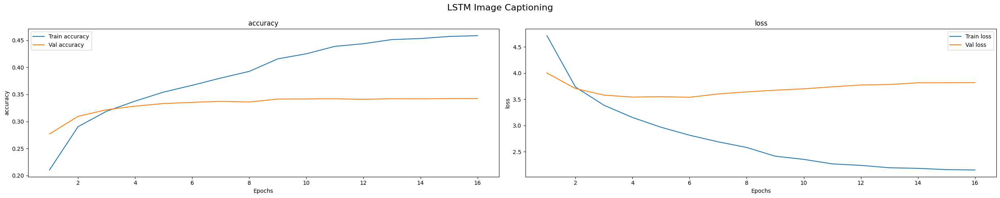

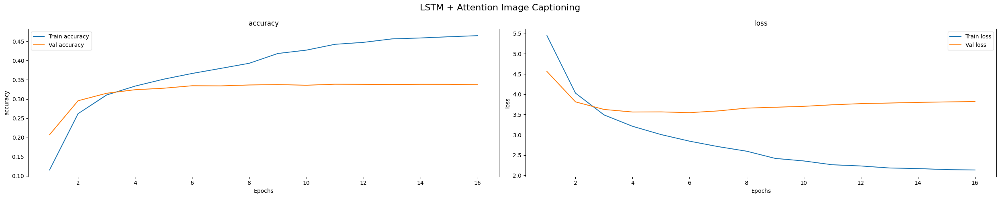

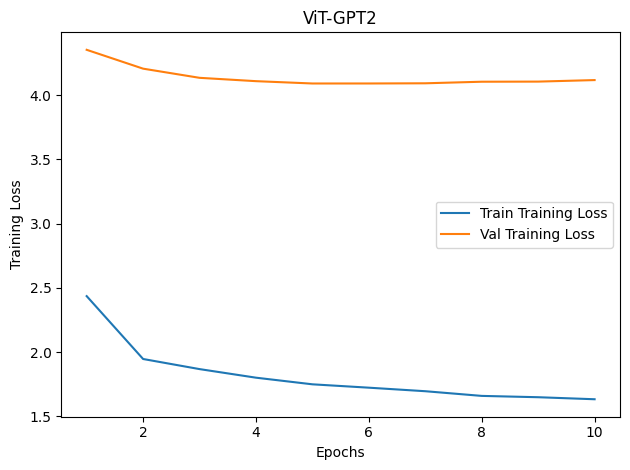

In [48]:
plotResults(history_lstm_captioning, model_name = 'LSTM Image Captioning')
plotResults(history_lstm_attention_captioning, model_name = 'LSTM + Attention Image Captioning')

metrics = ['Training Loss']
val_metrics = ['Validation Loss']

epochs = range(1, len(historyViTGPT2['Training Loss']) + 1)

plt.plot(figsize=(5, 5))

plt.plot(epochs, historyViTGPT2[metric], label=f'Train {metric}')
plt.plot(epochs, historyViTGPT2[val_metric], label=f'Val {metric}')
plt.title('ViT-GPT2')
plt.xlabel('Epochs')
plt.ylabel(metric)
plt.legend()

plt.tight_layout()
plt.show()

# Evaluation

In [49]:
def idx_to_word(interger, tokenizer):
    for word, index in tokenizer.word_index.items():
        if index == interger:
            return word
    return None

def predictCaption(model, image, tokenizer, max_length, features):
    feature = features[image]
    in_text = 'sos'
    for i in range(max_length):
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        sequence = pad_sequences([sequence], max_length)
        y_pred = np.argmax(model.predict([feature, sequence], verbose = 0))

        word = idx_to_word(y_pred, tokenizer)
        if word is None:
            break

        in_text += " " + word

        if word == 'eos':
            break
    return in_text

In [50]:
samples = test_df.sample(6)
samples.reset_index(drop = True, inplace = True)

for index, record in samples.iterrows():
    img = readImage(os.path.join(PATH, record['image']))
    captionLSTM = predictCaption(model_lstm_captioning, record['image'], tokenizer, max_length, features)
    samples.loc[index, 'predictedLSTM'] = captionLSTM
    captionLSTMAttention = predictCaption(model_lstm_attention_captioning, record['image'], tokenizer, max_length, features)
    samples.loc[index, 'predictedLSTMAttention'] = captionLSTMAttention

for i in range(samples.shape[0]):
    grouth_true = samples['captionn'][i][4:-4]
    predictedLSTM = samples['predictedLSTM'][i][4:-4]
    predictedLSTMAttention = samples['predictedLSTMAttention'][i][4:-4]

    bleu_predictedLSTM = sentence_bleu([grouth_true.split(' ')], predictedLSTM.split(' '), smoothing_function = SmoothingFunction().method1)
    bleu_predictedLSTMAttention = sentence_bleu([grouth_true.split(' ')], predictedLSTMAttention.split(' '), smoothing_function = SmoothingFunction().method1)

    print(f"Sample {i}")
    print(f"Grouth True caption: {grouth_true}")
    print(f"LSTM predicted caption: {predictedLSTM}")
    print(f"BLEU score of grouth true and LSTM predicted: {bleu_predictedLSTM}")
    print(f"LSTM Attention predicted caption: {predictedLSTMAttention}")
    print(f"BLEU score of grouth true and LSTM Attention predicted: {bleu_predictedLSTMAttention}")
    print()

Sample 0
Grouth True caption: group of people standing on small balcony of large building
LSTM predicted caption: man is standing on wall
BLEU score of grouth true and LSTM predicted: 0.0417991745584234
LSTM Attention predicted caption: man is standing in front of building
BLEU score of grouth true and LSTM Attention predicted: 0.028319415510892395

Sample 1
Grouth True caption: small child wearing blue coat climbing into red toy car
LSTM predicted caption: two children ride on tire ride
BLEU score of grouth true and LSTM predicted: 0
LSTM Attention predicted caption: two children are riding on the street
BLEU score of grouth true and LSTM Attention predicted: 0

Sample 2
Grouth True caption: woman stands next to child who is riding on toy
LSTM predicted caption: two girls are standing on sidewalk
BLEU score of grouth true and LSTM predicted: 0.020960166113993737
LSTM Attention predicted caption: two girls are standing on the sidewalk
BLEU score of grouth true and LSTM Attention predic

In [70]:
def computeBLEUScore(model, sample_size = 100, model_name = 'model'):
    samples = test_df.sample(sample_size)
    samples.reset_index(drop = True, inplace = True)

    for index, record in samples.iterrows():
        img = readImage(os.path.join(PATH, record['image']))
        caption = predictCaption(model, record['image'], tokenizer, max_length, features)
        samples.loc[index, 'predicted'] = caption
    
    references = [
        [[word for word in ref.lower().split() if word not in ['sos', 'eos']]]
        for ref in samples['captionn']
    ]
    hypotheses = [
        [word for word in pred.lower().split() if word not in ['sos', 'eos']]
        for pred in samples['predicted']
    ]

    bleu_score = corpus_bleu(references, hypotheses, smoothing_function = SmoothingFunction().method1)
    return f"{model_name} BLEU score of 100 samples: {bleu_score}"

In [72]:
computeBLEUScore(model_lstm_captioning, model_name = 'LSTM Image Captioning')

'LSTM Image Captioning BLEU score of 100 samples: 0.01378593620746978'

In [73]:
computeBLEUScore(model_lstm_attention_captioning, model_name = 'LSTM Attention Image Captioning')

'LSTM Attention Image Captioning BLEU score of 100 samples: 0.05020669173036576'

In [76]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

ViT_GPT2 = ViT_GPT2.to(device)

for i in range(samples.shape[0]):
    img = Image.open(os.path.join('/kaggle/input/flickr8k/Images', samples['image'][i])).convert("RGB")
    pixel_values = feature_extractor(img, return_tensors="pt").pixel_values.to(device)
    
    with torch.no_grad():
        output_ids = ViT_GPT2.generate(pixel_values, pad_token_id=Tokenizer.eos_token_id)[0]
        caption = Tokenizer.decode(output_ids, skip_special_tokens=True)

    bleu_ViT_GPT2 = sentence_bleu([samples['caption'][i].split(' ')], caption.split(' '), smoothing_function = SmoothingFunction().method1)
    
    print(f'Sample {i}')
    print(f"Grouth True caption: {samples['caption'][i]}")
    print(f"ViT-GPT2 predicted caption: {caption}")
    print(f"BLEU score of grouth true and ViT-GPT2 predicted: {bleu_ViT_GPT2}")
    print()

Sample 0
Grouth True caption: a group of people standing on a small balcony of a large building
ViT-GPT2 predicted caption:  man a and dog on beach sunset sunset sunset trees background . in . . . of . . ocean sunset sunset clouds clouds clouds . sky sky sky clouds clouds water . . sky . clouds clouds sky sky . . with clouds clouds sunset sky . sky skies sky . sunset clouds sky . with . sky background clouds clouds skies . sky with . . clouds sky background sky . people in . water the . water background sky sky people water . water in . sky foreground people water sunset sunset sky sunset sky sky water sunset sky water background . people water background sunset sky people sunset sky ocean sunset sky clouds water background people water sky sky sunset people sky sky
BLEU score of grouth true and ViT-GPT2 predicted: 0.0019881146962454337

Sample 1
Grouth True caption: A small child wearing a blue coat climbing into a red toy car .
ViT-GPT2 predicted caption:  man a and dog on beach suns

In [90]:
samples = test_df.sample(100)
samples.reset_index(drop = True, inplace = True)

for i in range(samples.shape[0]):
    img = Image.open(os.path.join('/kaggle/input/flickr8k/Images', samples['image'][i])).convert("RGB")
    pixel_values = feature_extractor(img, return_tensors="pt").pixel_values.to(device)
    
    with torch.no_grad():
        output_ids = ViT_GPT2.generate(pixel_values, pad_token_id=Tokenizer.eos_token_id)[0]
        caption = Tokenizer.decode(output_ids, skip_special_tokens=True)
        samples.loc[i, 'predicted'] = caption

references = [
    [[word for word in ref.lower().split() if word not in ['sos', 'eos']]]
    for ref in samples['captionn']
]
hypotheses = [
    [word for word in pred.lower().split() if word not in ['sos', 'eos']]
    for pred in samples['predicted']
]

bleu_score = corpus_bleu(references, hypotheses, smoothing_function = SmoothingFunction().method1)
print(f"ViT-GPT2 BLEU score of 100 samples: {bleu_score}")

ViT-GPT2 BLEU score of 100 samples: 5.349117375162878e-05


# Inference

In [106]:
def visualizeInference(path, temp_df, text_col = 'captionn'):
    temp_df = temp_df.sample(6).reset_index(drop = True)
    
    fig, axes = plt.subplots(2, 3, figsize = (20, 20))
    axes = axes.flatten()

    for index, record in temp_df.iterrows():
        image = readImage(os.path.join(path, record['image']))
        caption = temp_df[text_col].iloc[index]
        captionLSTM = predictCaption(model_lstm_captioning, record['image'], tokenizer, max_length, features)
        captionLSTMAttention = predictCaption(model_lstm_attention_captioning, record['image'], tokenizer, max_length, features)

        axes[index].imshow(image)
        axes[index].axis('off')
        
        title = f"GT: {caption}\nLSTM: {captionLSTM}\nLSTM Attention: {captionLSTMAttention}"
        axes[index].set_title(title, fontsize=10)

    plt.tight_layout()
    plt.show()

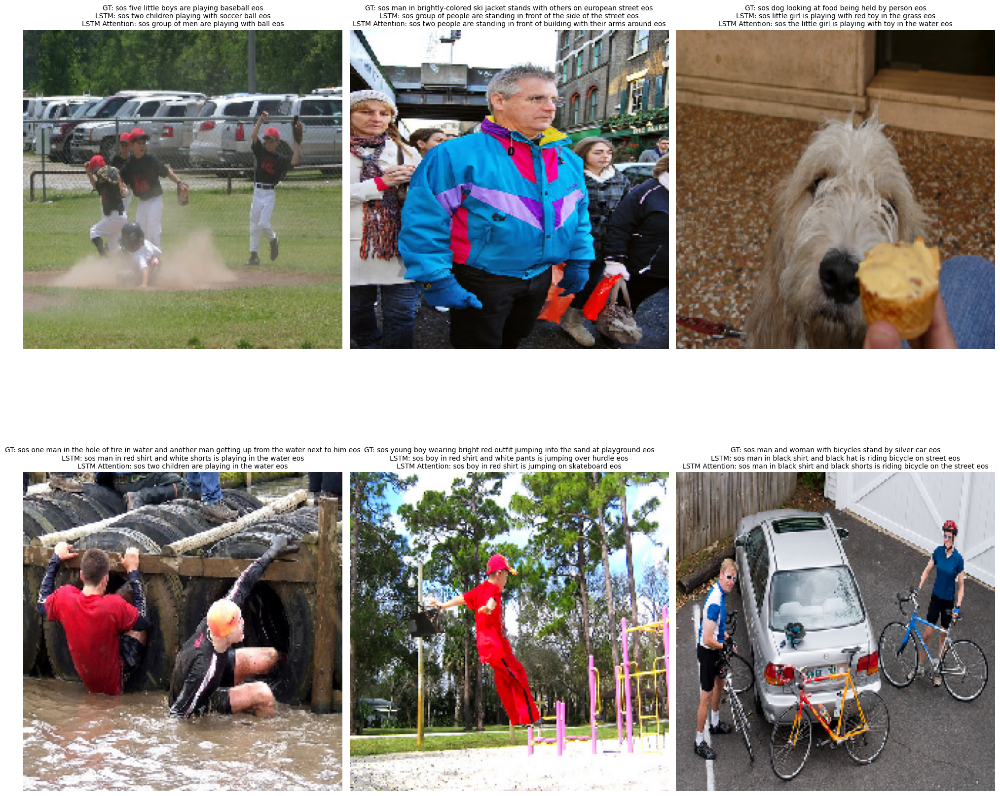

In [107]:
visualizeInference(PATH, test_df)

In [ ]:
def visualizeInference(path, temp_df, text_col = 'captionn'):
    temp_df = temp_df.sample(6).reset_index(drop = True)
    
    fig, axes = plt.subplots(2, 3, figsize = (20, 20))
    axes = axes.flatten()

    for index, record in temp_df.iterrows():
        image = readImage(os.path.join(path, record['image']))
        caption = temp_df[text_col].iloc[index]
        captionLSTM = predictCaption(model_lstm_captioning, record['image'], tokenizer, max_length, features)
        captionLSTMAttention = predictCaption(model_lstm_attention_captioning, record['image'], tokenizer, max_length, features)

        axes[index].imshow(image)
        axes[index].axis('off')
        
        title = f"GT: {caption}\nLSTM: {captionLSTM}\nLSTM Attention: {captionLSTMAttention}"
        axes[index].set_title(title, fontsize=10)

    plt.tight_layout()
    plt.show()

In [104]:
caption = test_df['captionn'].iloc[0]
img = Image.open(os.path.join('/kaggle/input/flickr8k/Images', test_df['image'][0])).convert("RGB")
pixel_values = feature_extractor(img, return_tensors="pt").pixel_values.to(device)
    
with torch.no_grad():
    output_ids = ViT_GPT2.generate(pixel_values, pad_token_id=Tokenizer.eos_token_id)[0]
    caption_ = Tokenizer.decode(output_ids, skip_special_tokens=True)

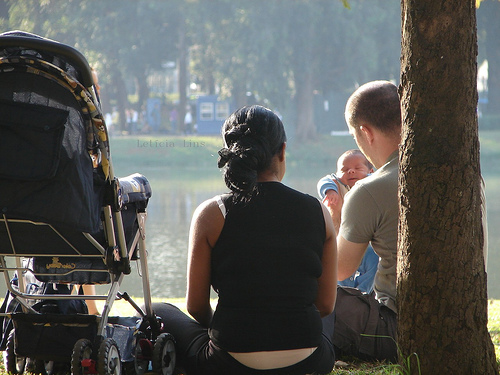

In [105]:
img

In [106]:
print()
print(caption)
print()
print(caption_)


sos couple and an infant being held by the male sitting next to pond with near by stroller eos

 man a and dog on beach sunset sunset sunset trees background . in . . . of . . ocean sunset sunset clouds clouds clouds . sky sky sky clouds clouds water . . sky . clouds clouds sky sky . . with clouds clouds sunset sky . sky background clouds water sky . with in . sky skies sky . sunset sky sky background sky sky with clouds water background sky . skies clouds sky . people in . water the . sunset sunset sky sunset sky people water . people water in . sunset . sky water background people water sunset people water water sunset sunset people sky sky water sunset . people sky water sky sky sunset people . water sky background people sky


In [113]:
caption = test_df['captionn'].iloc[10]
img = Image.open(os.path.join('/kaggle/input/flickr8k/Images', test_df['image'][10])).convert("RGB")
pixel_values = feature_extractor(img, return_tensors="pt").pixel_values.to(device)
    
with torch.no_grad():
    output_ids = ViT_GPT2.generate(pixel_values, pad_token_id=Tokenizer.eos_token_id)[0]
    caption_ = Tokenizer.decode(output_ids, skip_special_tokens=True)

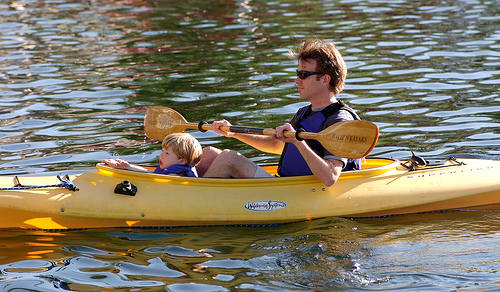

In [114]:
img

In [115]:
print()
print(caption)
print()
print(caption_)


sos man and baby are in yellow kayak on water eos

 man a and dog on beach sunset sunset sunset trees background . in . . . of . . ocean sunset sunset clouds clouds clouds . sky sky sky clouds clouds water . . sky . clouds clouds sky sky . . with clouds clouds sunset sky . sky skies sky . sunset clouds sky . with . sky background clouds clouds skies . sky with . . clouds sky background sky . people in . water the . water background sky sky people water . water in . sky foreground people water sunset sunset sky sunset sky sky water sunset sky water background . people water background sunset sky people sunset sky ocean sunset sky clouds water background people water sky sky sunset people sky sky


In [116]:
caption = test_df['captionn'].iloc[20]
img = Image.open(os.path.join('/kaggle/input/flickr8k/Images', test_df['image'][20])).convert("RGB")
pixel_values = feature_extractor(img, return_tensors="pt").pixel_values.to(device)
    
with torch.no_grad():
    output_ids = ViT_GPT2.generate(pixel_values, pad_token_id=Tokenizer.eos_token_id)[0]
    caption_ = Tokenizer.decode(output_ids, skip_special_tokens=True)

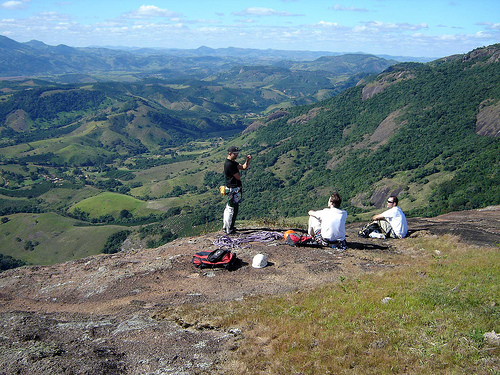

In [117]:
img

In [118]:
print()
print(caption)
print()
print(caption_)


sos people sit on the mountainside and check out the view eos

 man a and dog on beach sunset sunset sunset trees background . in . . . of . . ocean sunset sunset clouds clouds clouds . sky sky sky clouds clouds water . . sky . clouds clouds sky sky . . with clouds clouds sunset sky . sky background clouds water sky . with in . sky skies sky . sunset sky sky background sky sky with clouds water background sky water background clouds clouds background sky . skies sky sky skies . with . sky clouds sky . water background skies people in . water in . skies sunset sunset sky people water water water background . people water background water background people water . people sky sky water sky people sky water sunset people
